## Optimization in Relation to Problem-Solving

#### This script follows the structure below

## 1.Importing libraries
## 2.Data Wrangling
## 3.Subsetting & 3D Visual
## 4.Optimization
## 5.Three Observations over the past 60 years

# 1. Importing libraries

In [4]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [5]:
# Creating a path for importing the climate data set

path = r'/Users/daniel/Desktop/Ordner/Data Analyst/Data Analytics Course/Data Specialization/Achievement 1/Data Sets'

In [6]:
# Import the data set

df_scal = pd.read_csv(os.path.join(path, '[DATASET]_scaled.csv'),index_col = False)

df_org = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed.csv'),index_col = False)

# 2. Data Wrangling

In [8]:
# Show all the columns in the data set

pd.set_option('display.max_info_columns', 200)

#### Scaled Data Set

In [10]:
# Check the first few columns of the data

df_scal.head()

,Unnamed: 0,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,-0.528623,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,-0.582946,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,2,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,-0.257010,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,3,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,-0.555784,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,4,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,-1.003946,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


In [11]:
# Drop unnamed column

df_scal = df_scal.drop('Unnamed: 0', axis=1)

In [12]:
# Check for data information

df_scal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22950 entries, 0 to 22949
Data columns (total 168 columns):
 #    Column                       Non-Null Count  Dtype  
---   ------                       --------------  -----  
 0    BASEL_cloud_cover            22950 non-null  float64
 1    BASEL_wind_speed             22950 non-null  float64
 2    BASEL_humidity               22950 non-null  float64
 3    BASEL_pressure               22950 non-null  float64
 4    BASEL_global_radiation       22950 non-null  float64
 5    BASEL_precipitation          22950 non-null  float64
 6    BASEL_snow_depth             22950 non-null  float64
 7    BASEL_sunshine               22950 non-null  float64
 8    BASEL_temp_mean              22950 non-null  float64
 9    BASEL_temp_min               22950 non-null  float64
 10   BASEL_temp_max               22950 non-null  float64
 11   BELGRADE_cloud_cover         22950 non-null  float64
 12   BELGRADE_humidity            22950 non-null  float64
 13  

In [13]:
# Check for missing values

df_scal.isnull().sum()

BASEL_cloud_cover         0
BASEL_wind_speed          0
BASEL_humidity            0
BASEL_pressure            0
BASEL_global_radiation    0
                         ..
VALENTIA_snow_depth       0
VALENTIA_sunshine         0
VALENTIA_temp_mean        0
VALENTIA_temp_min         0
VALENTIA_temp_max         0
Length: 168, dtype: int64

__Comment:__ No missing values detected.

In [15]:
# Check for duplicate values

duplicate_value = df_scal.duplicated()

print(f"Total duplicate value: {duplicate_value.sum()}")

Total duplicate value: 0


#### Original Data Set

In [17]:
# Check the first few columns of the data

df_org.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


In [18]:
# Check for data information

df_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22950 entries, 0 to 22949
Data columns (total 170 columns):
 #    Column                       Non-Null Count  Dtype  
---   ------                       --------------  -----  
 0    DATE                         22950 non-null  int64  
 1    MONTH                        22950 non-null  int64  
 2    BASEL_cloud_cover            22950 non-null  int64  
 3    BASEL_wind_speed             22950 non-null  float64
 4    BASEL_humidity               22950 non-null  float64
 5    BASEL_pressure               22950 non-null  float64
 6    BASEL_global_radiation       22950 non-null  float64
 7    BASEL_precipitation          22950 non-null  float64
 8    BASEL_snow_depth             22950 non-null  int64  
 9    BASEL_sunshine               22950 non-null  float64
 10   BASEL_temp_mean              22950 non-null  float64
 11   BASEL_temp_min               22950 non-null  float64
 12   BASEL_temp_max               22950 non-null  float64
 13  

In [19]:
# Change the data type for the data column

df_org["DATE"] = pd.to_datetime(df_org["DATE"].astype(str), format='%Y%m%d')

In [20]:
df_org.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,1960-01-01,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,1960-01-02,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,1960-01-03,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,1960-01-04,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,1960-01-05,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


In [21]:
# Check for missing values

df_org.isnull().sum()

DATE                   0
MONTH                  0
BASEL_cloud_cover      0
BASEL_wind_speed       0
BASEL_humidity         0
                      ..
VALENTIA_snow_depth    0
VALENTIA_sunshine      0
VALENTIA_temp_mean     0
VALENTIA_temp_min      0
VALENTIA_temp_max      0
Length: 170, dtype: int64

In [22]:
# Check for duplicate values

duplicate_value = df_org.duplicated()

print(f"Total duplicate value: {duplicate_value.sum()}")

Total duplicate value: 0


In [23]:
# Extract the date and month column from the original data frame
df_dates = df_org[['DATE', 'MONTH']].copy()

In [24]:
df_dates.head()

,DATE,MONTH
0,1960-01-01,1
1,1960-01-02,1
2,1960-01-03,1
3,1960-01-04,1
4,1960-01-05,1


In [25]:
# Check for columns and rows

df_dates.shape

(22950, 2)

In [26]:
# Check for columns and rows

df_scal.shape

(22950, 168)

In [27]:
# Merge the original and scaled data set, because I need the date and month column
# for looking at specific periods in team during further analysis

df_temp = df_dates.merge(df_scal, left_index=True, right_index=True)

In [28]:
df_temp.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,1960-01-01,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,1960-01-02,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,1960-01-03,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,1960-01-04,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,1960-01-05,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


In [29]:
# Check for correct merge without additional columns

df_temp.shape

(22950, 170)

In [30]:
# Create a subset of data considering the mean value of temperature
# data across european weather stations

df_temp_eu = df_temp[['DATE',
                      'MONTH',
                      'BASEL_temp_mean',
                      'BELGRADE_temp_mean',
                      'BUDAPEST_temp_mean',
                      'DEBILT_temp_mean',
                      'DUSSELDORF_temp_mean',
                      'GDANSK_temp_mean',
                      'HEATHROW_temp_mean',
                      'KASSEL_temp_mean',
                      'LJUBLJANA_temp_mean',
                      'MAASTRICHT_temp_mean',
                      'MADRID_temp_mean',
                      'MUNCHENB_temp_mean',
                      'OSLO_temp_mean',
                      'ROMA_temp_mean',
                      'SONNBLICK_temp_mean',
                      'STOCKHOLM_temp_mean',
                      'TOURS_temp_mean',
                      'VALENTIA_temp_mean']].copy()

In [31]:
# Check the first few rows of the subset

df_temp_eu.head()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,1960-01-01,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,1960-01-02,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,1960-01-03,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,1960-01-04,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,1960-01-05,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396


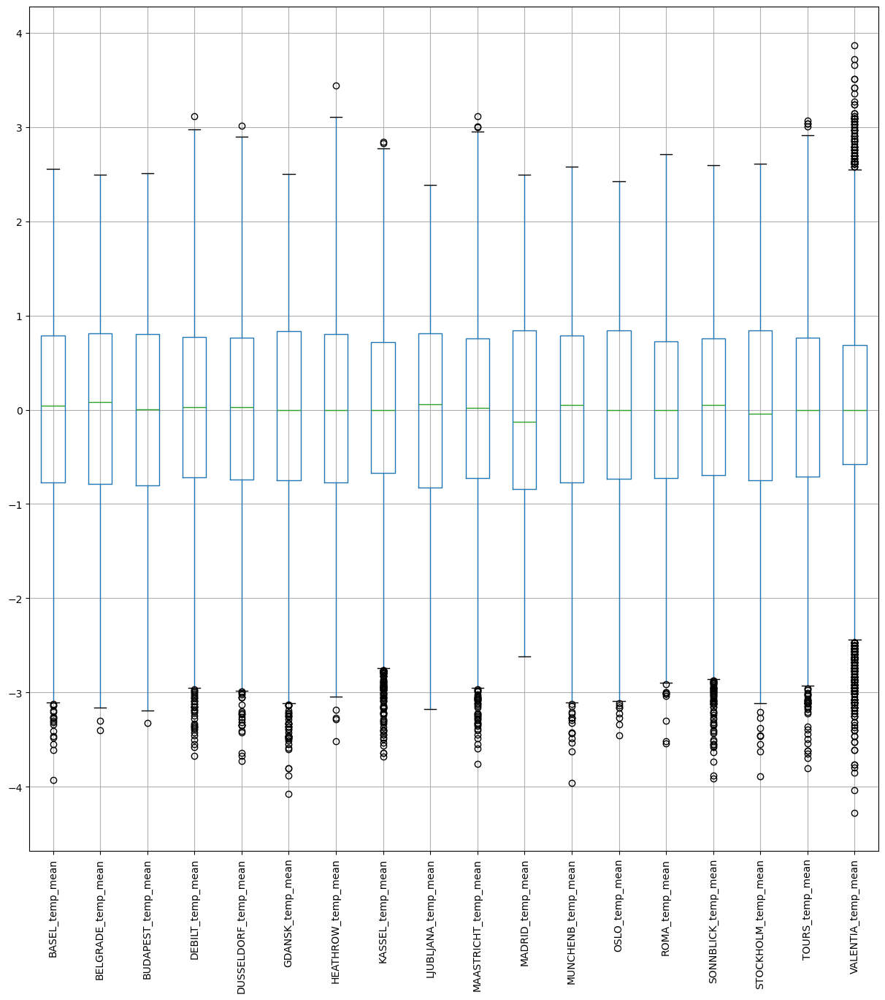

In [32]:
# Create a whisker plot of the subset to see variations in temperatures

# Drop the date and month, since no need to be scaled.

df_temp_scal = df_temp_eu.drop(['DATE','MONTH'], axis=1)

plt.figure(figsize=(15, 15))  # Set figure size
df_temp_scal.boxplot()  # Create boxplot
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()  # Display the plot

In [33]:
df_temp_eu[['DATE']].describe()

,DATE
count,22950
mean,1991-06-01 12:00:00
min,1960-01-01 00:00:00
25%,1975-09-16 06:00:00
50%,1991-06-01 12:00:00
75%,2007-02-14 18:00:00
max,2022-10-31 00:00:00


## 3. Subsetting & 3D Visual

In [35]:
# Create three data sets looking at different years

df_1960 = df_temp_eu[(df_temp_eu["DATE"] >= "1960-01-01") & (df_temp_eu["DATE"] <= "1960-12-31")]
print(df_1960)

df_1990 = df_temp_eu[(df_temp_eu["DATE"] >= "1990-01-01") & (df_temp_eu["DATE"] <= "1990-12-31")]
print(df_1990)

df_2020 = df_temp_eu[(df_temp_eu["DATE"] >= "2020-01-01") & (df_temp_eu["DATE"] <= "2020-12-31")]
print(df_2020)

          DATE  MONTH  BASEL_temp_mean  BELGRADE_temp_mean  \
0   1960-01-01      1        -0.528623           -1.016876   
1   1960-01-02      1        -0.582946           -1.107669   
2   1960-01-03      1        -0.257010           -1.084971   
3   1960-01-04      1        -0.555784           -1.209812   
4   1960-01-05      1        -1.003946           -1.209812   
..         ...    ...              ...                 ...   
361 1960-12-27     12        -1.289140           -1.277907   
362 1960-12-28     12        -1.289140           -1.255208   
363 1960-12-29     12        -1.207656           -1.221161   
364 1960-12-30     12        -1.547172           -1.243859   
365 1960-12-31     12        -1.139752           -1.107669   

     BUDAPEST_temp_mean  DEBILT_temp_mean  DUSSELDORF_temp_mean  \
0             -1.099163         -0.114356             -0.105836   
1             -1.110927         -0.367511             -0.370915   
2             -1.063873         -0.509912             

In [36]:
# Further narrow down the data by looking on certain weather stations

df_1960_mun = df_1960[['DATE','MONTH','MUNCHENB_temp_mean']].copy()
print(df_1960_mun)

df_1990_mun = df_1990[['DATE','MONTH','MUNCHENB_temp_mean']].copy()
print(df_1990_mun)

df_2020_mun = df_2020[['DATE','MONTH','MUNCHENB_temp_mean']].copy()
print(df_2020_mun)

df_1960_mad = df_1960[['DATE','MONTH','MADRID_temp_mean']].copy()
print(df_1960_mad)

df_1990_mad = df_1990[['DATE','MONTH','MADRID_temp_mean']].copy()
print(df_1990_mad)

df_2020_mad = df_2020[['DATE','MONTH','MADRID_temp_mean']].copy()
print(df_2020_mad)

df_1960_heath = df_1960[['DATE','MONTH','HEATHROW_temp_mean']].copy()
print(df_1960_mad)

df_1990_heath = df_1990[['DATE','MONTH','HEATHROW_temp_mean']].copy()
print(df_1990_heath)

df_2020_heath = df_2020[['DATE','MONTH','HEATHROW_temp_mean']].copy()
print(df_2020_heath)

          DATE  MONTH  MUNCHENB_temp_mean
0   1960-01-01      1           -0.265742
1   1960-01-02      1           -0.353714
2   1960-01-03      1           -0.403983
3   1960-01-04      1           -0.642763
4   1960-01-05      1           -0.906678
..         ...    ...                 ...
361 1960-12-27     12           -1.120324
362 1960-12-28     12           -1.321402
363 1960-12-29     12           -1.459643
364 1960-12-30     12           -1.547614
365 1960-12-31     12           -1.195728

[366 rows x 3 columns]
            DATE  MONTH  MUNCHENB_temp_mean
10958 1990-01-01      1           -1.811529
10959 1990-01-02      1           -1.522480
10960 1990-01-03      1           -1.359104
10961 1990-01-04      1           -1.710990
10962 1990-01-05      1           -1.447075
...          ...    ...                 ...
11318 1990-12-27     12           -0.491955
11319 1990-12-28     12           -1.057487
11320 1990-12-29     12           -0.077232
11321 1990-12-30     12         

In [37]:
# Drop the date and month column as those numbers are not scaled with the rest

df_3d_mun = df_1960_mun.drop(['DATE','MONTH'], axis=1)

In [38]:
df_3d_mun.head()

,MUNCHENB_temp_mean
0,-0.265742
1,-0.353714
2,-0.403983
3,-0.642763
4,-0.906678


#### Create a 3D visualization of all temperatures in 1960

In [40]:
# Drop the date and month column as those numbers are not scaled with the rest

df_3d_1960 = df_1960.drop(['DATE','MONTH'], axis=1)

In [41]:
df_3d_1960.head()

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396


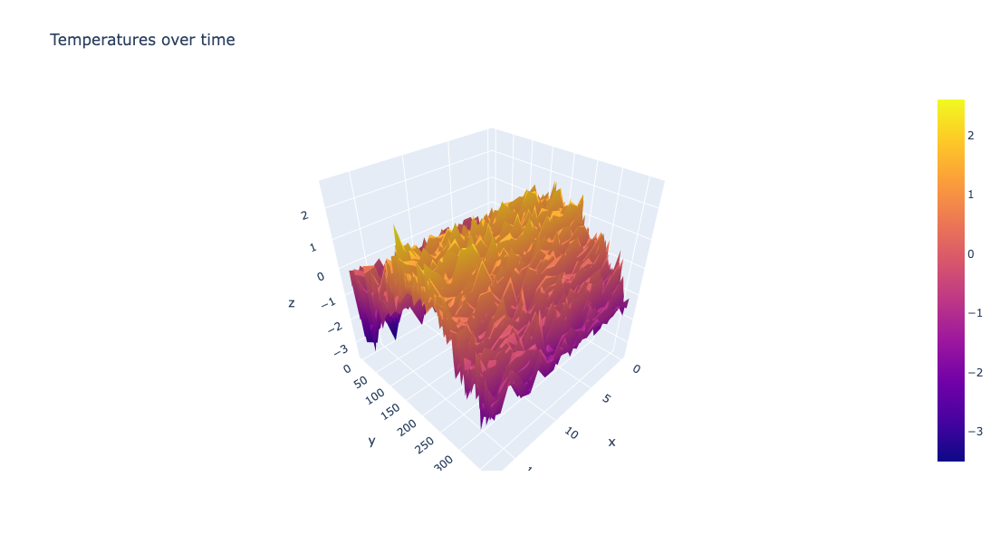

In [42]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=df_3d_1960.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

# 4. Optimization

### Weather Station Munich in 1960

In [45]:
# Assuming df_1960.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_1960.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_1960['MUNCHENB_temp_mean'].to_numpy().reshape(n_rows, 1)

In [46]:
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [47]:
# Look a the shapes

X.shape, y.shape

((366, 2), (366, 1))

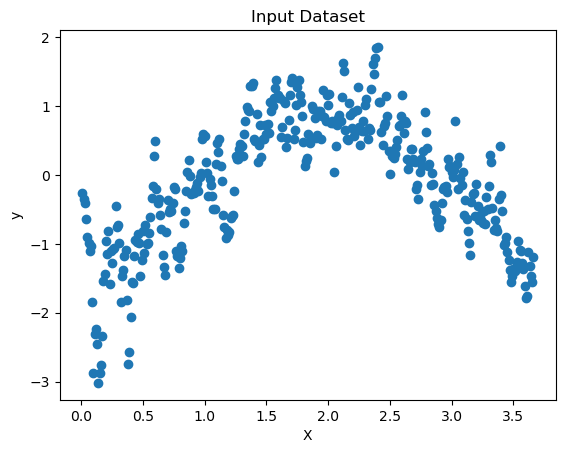

In [48]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=df_1960['MUNCHENB_temp_mean'])
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input Dataset');

In [49]:
# Show the min and max
print(f"Min. Temperature: {df_1960['MUNCHENB_temp_mean'].min()}")
print(f"Max. Temperature: {df_1960['MUNCHENB_temp_mean'].max()}")

Min. Temperature: -3.0179973340644315
Max. Temperature: 1.8581441649783847


In [50]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [51]:
#Check the costs
compute_cost(X,y)

array([0.44437913])

In [52]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [53]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 500 ms, sys: 6.75 ms, total: 507 ms
Wall time: 209 ms


In [54]:
#Check the theta
theta

array([[-0.45705651],
       [ 0.19366708]])

Starting value of theta0: -0.010167959283362428
Ending value of theta0: -0.4570565117505782
Starting value of theta1: 0.002961182093982806
Ending value of theta1: 0.19366708107059263


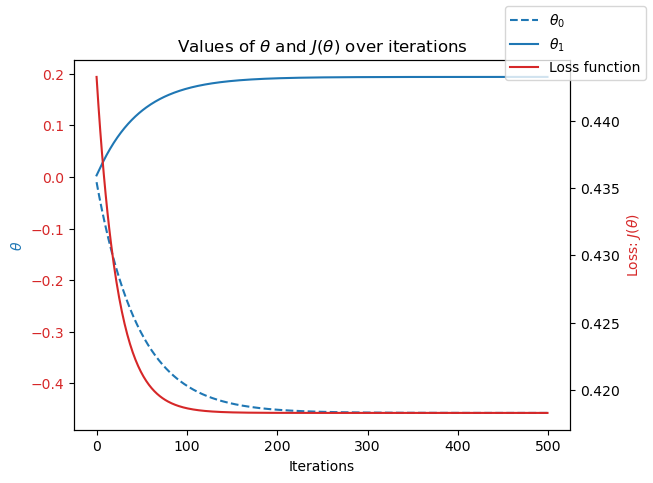

In [55]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [56]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.17 s, sys: 20.3 ms, total: 1.2 s
Wall time: 987 ms


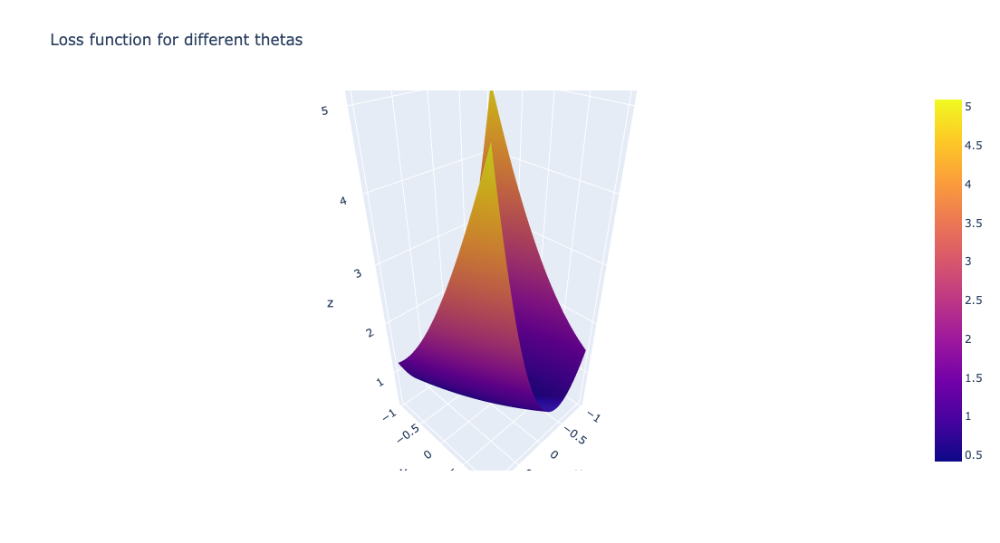

In [57]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

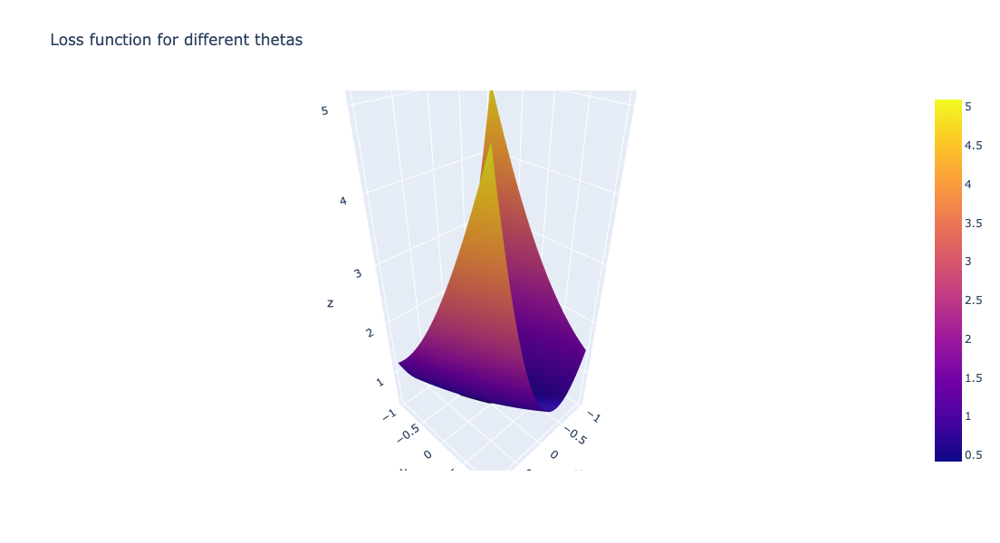

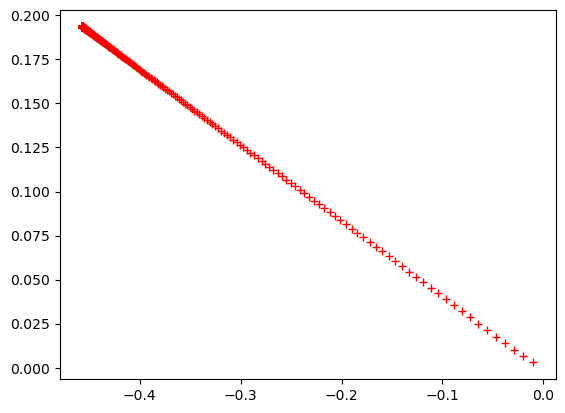

In [58]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [59]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[-0.05],[-0.05]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

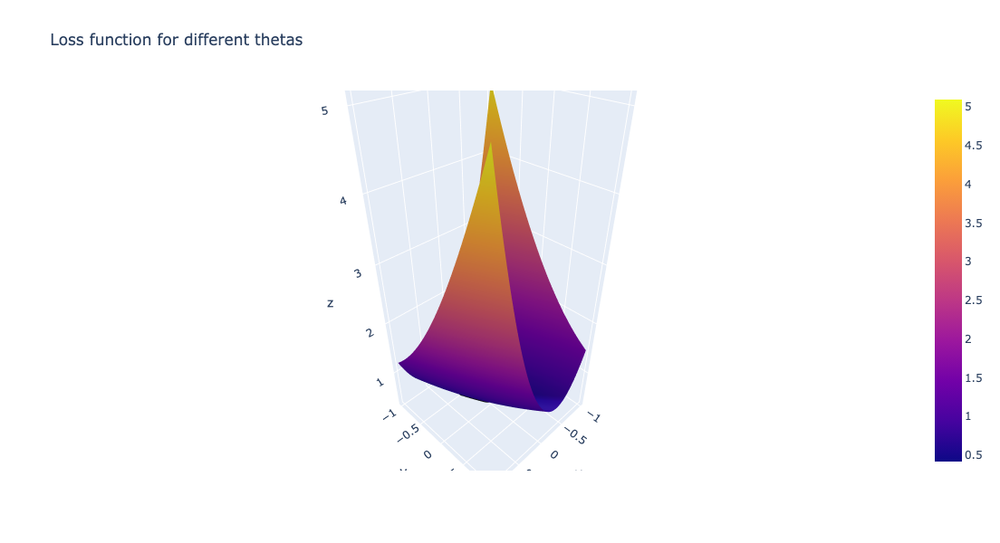

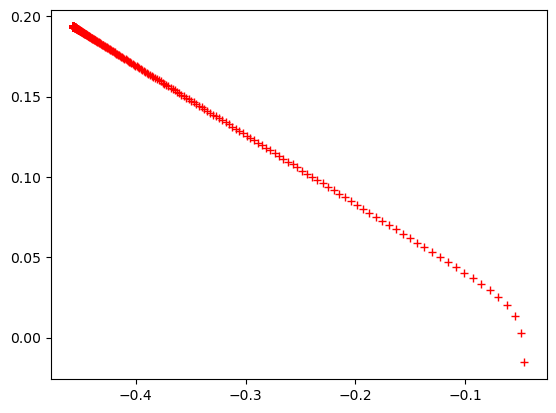

In [60]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

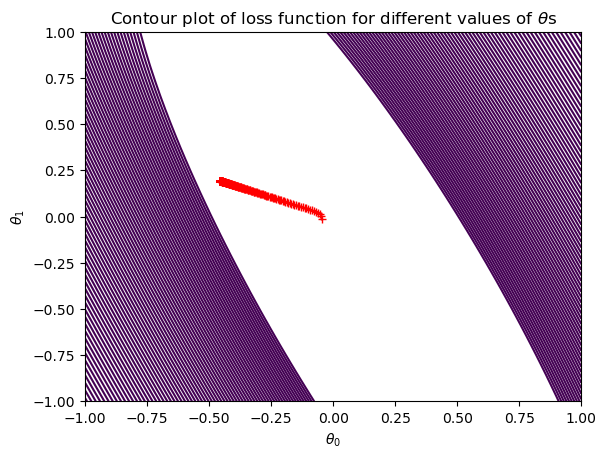

In [61]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

### 4.2 Weather Station Munich in 1990

In [63]:
# Assuming df_1990.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_1990.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_1990['MUNCHENB_temp_mean'].to_numpy().reshape(n_rows, 1)

In [64]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [65]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [66]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 421 ms, sys: 6.35 ms, total: 427 ms
Wall time: 195 ms


In [67]:
#Check the theta
theta

array([[-0.14228551],
       [ 0.07961018]])

Starting value of theta0: -1.0826593797671231
Ending value of theta0: -0.14228550670666795
Starting value of theta1: 0.7465505065374438
Ending value of theta1: 0.07961017571432381


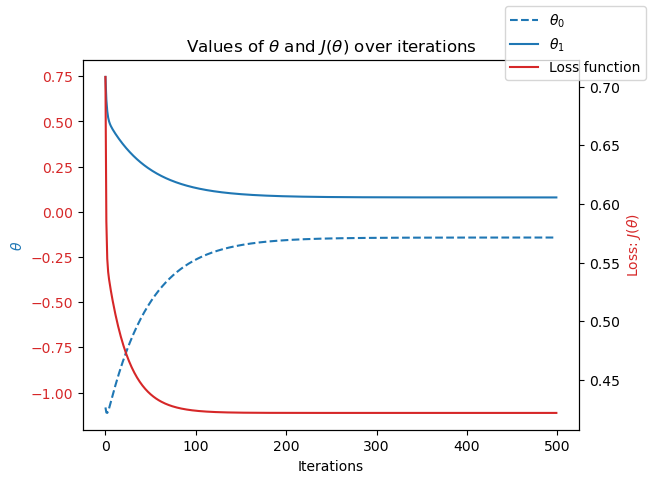

In [68]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [69]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.27 s, sys: 32.4 ms, total: 1.3 s
Wall time: 1.05 s


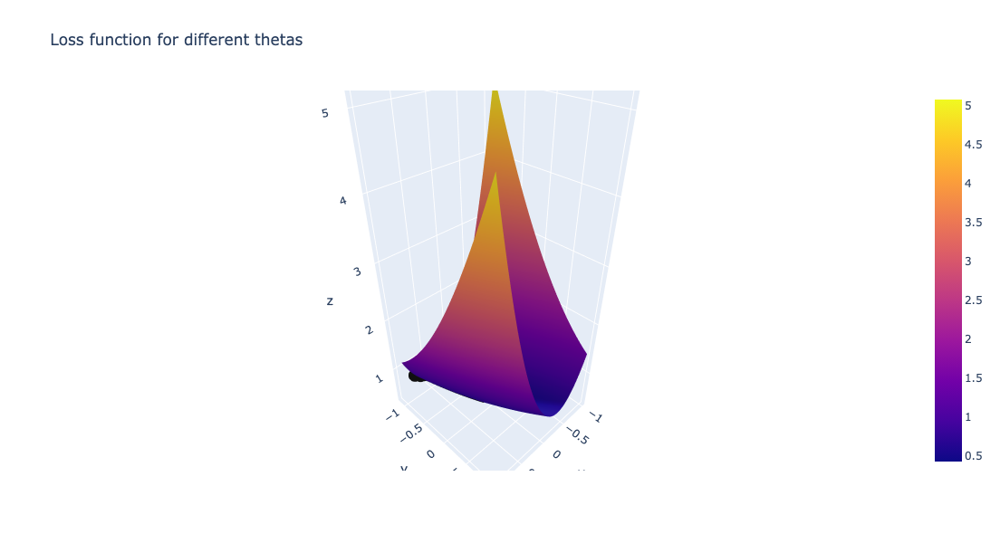

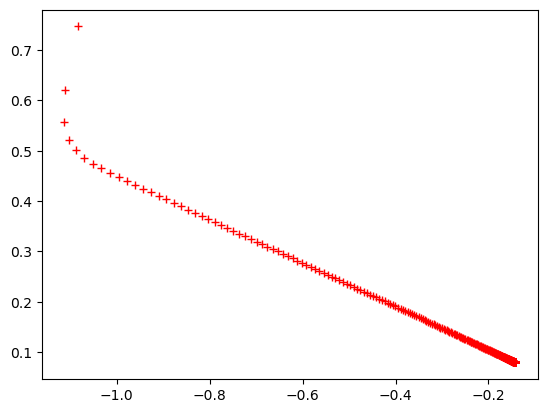

In [70]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [71]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[-0.05],[-0.05]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

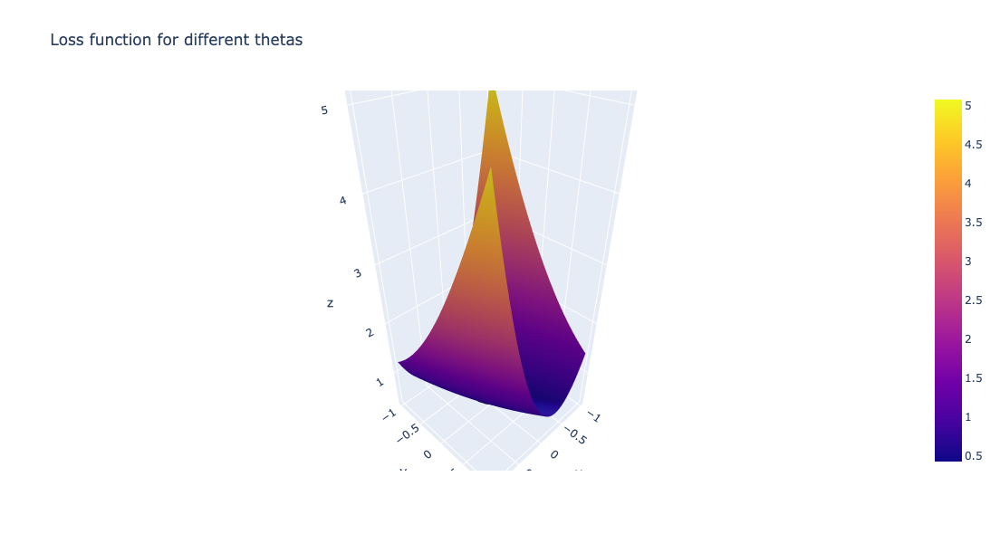

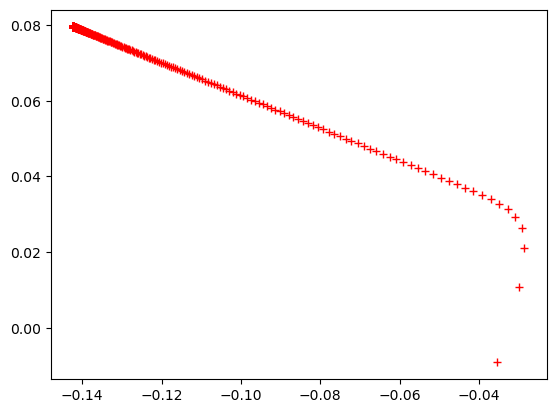

In [72]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

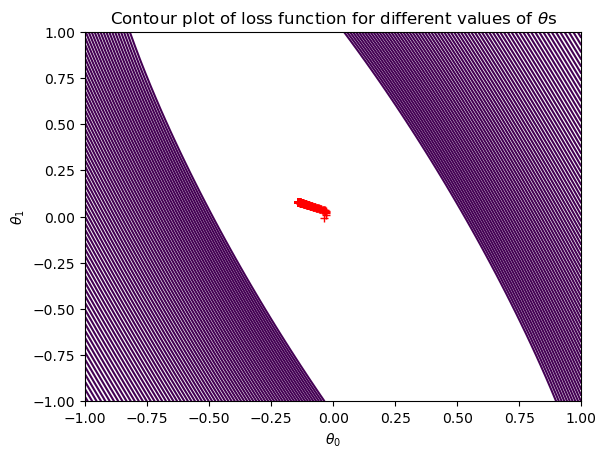

In [73]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

### 4.3 Weather Station Munich in 2020

In [75]:
# Assuming df_1990.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_2020.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_2020['MUNCHENB_temp_mean'].to_numpy().reshape(n_rows, 1)

In [76]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [77]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [78]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 404 ms, sys: 8.55 ms, total: 412 ms
Wall time: 168 ms


In [79]:
#Check the theta
theta

array([[0.11409172],
       [0.07408034]])

Starting value of theta0: -1.0584964778353485
Ending value of theta0: 0.11409171601521889
Starting value of theta1: 0.789297944624235
Ending value of theta1: 0.07408033762034355


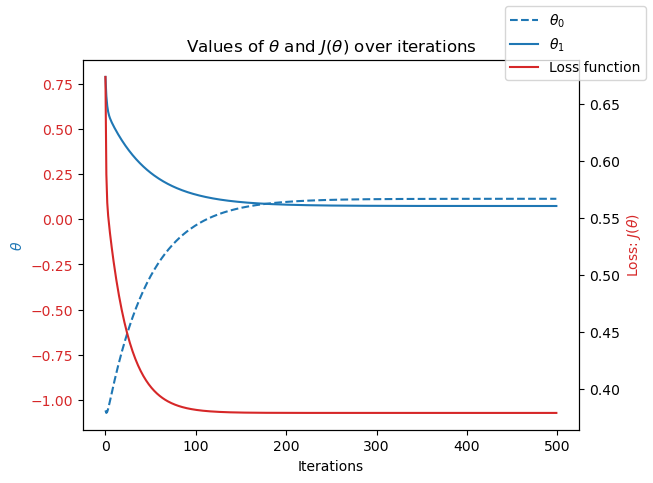

In [80]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [81]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.32 s, sys: 34.3 ms, total: 1.36 s
Wall time: 1.05 s


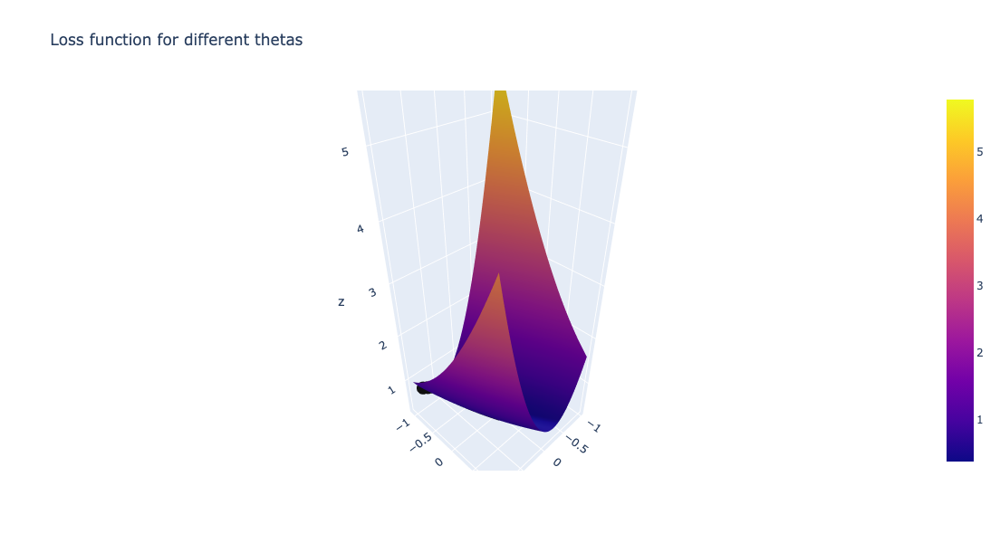

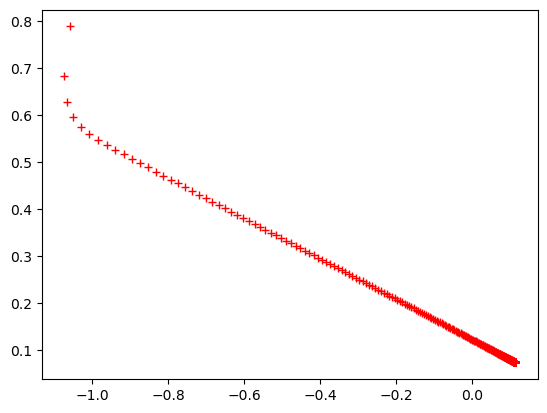

In [82]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [83]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[-0.05],[-0.05]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

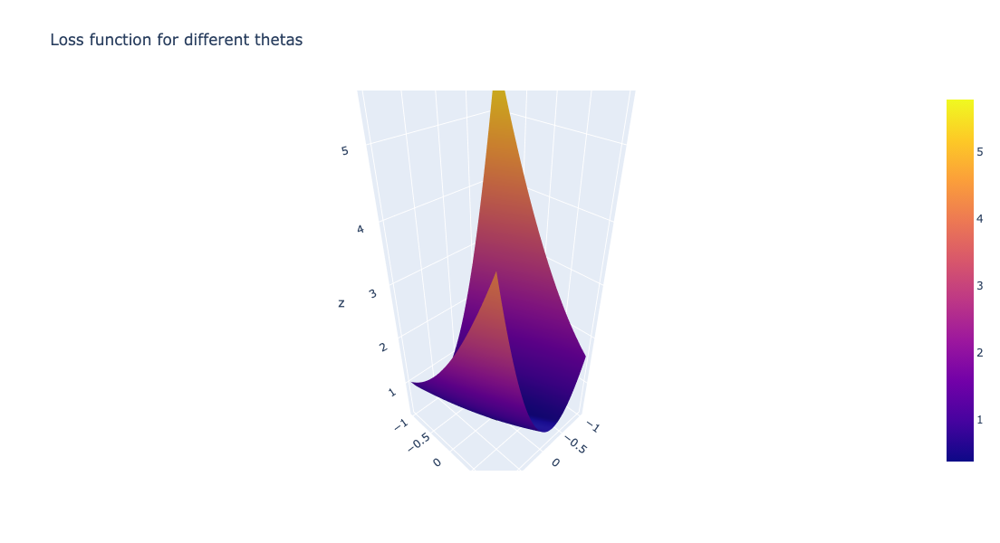

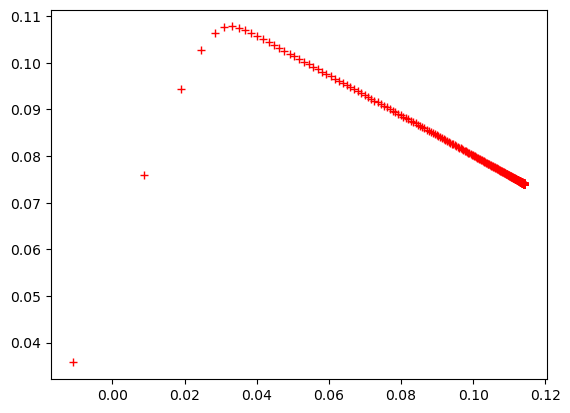

In [84]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 4.4 Weather Station Madrid in 1960

In [86]:
# Assuming df_1960.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_1960.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_1960['MADRID_temp_mean'].to_numpy().reshape(n_rows, 1)

In [87]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [88]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [89]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 501 ms, sys: 7.72 ms, total: 509 ms
Wall time: 201 ms


Starting value of theta0: -1.0965479968705896
Ending value of theta0: -0.30541876925367767
Starting value of theta1: 0.7218461167009484
Ending value of theta1: 0.095332119889766


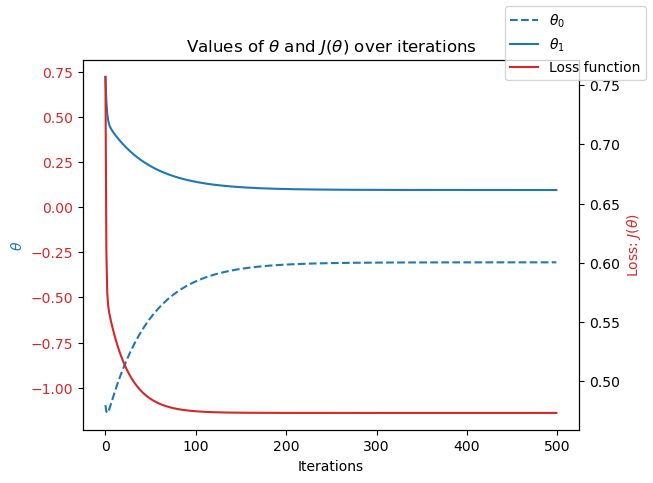

In [90]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [91]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.32 s, sys: 19.8 ms, total: 1.34 s
Wall time: 1.04 s


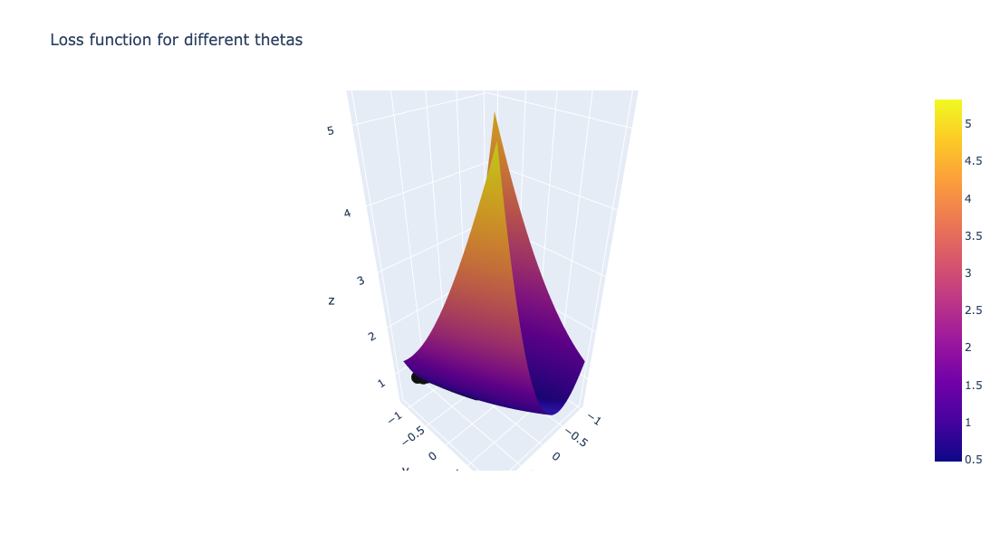

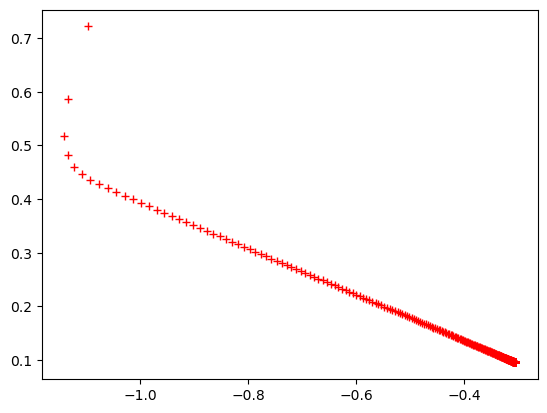

In [92]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [93]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[0.5],[-0.5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

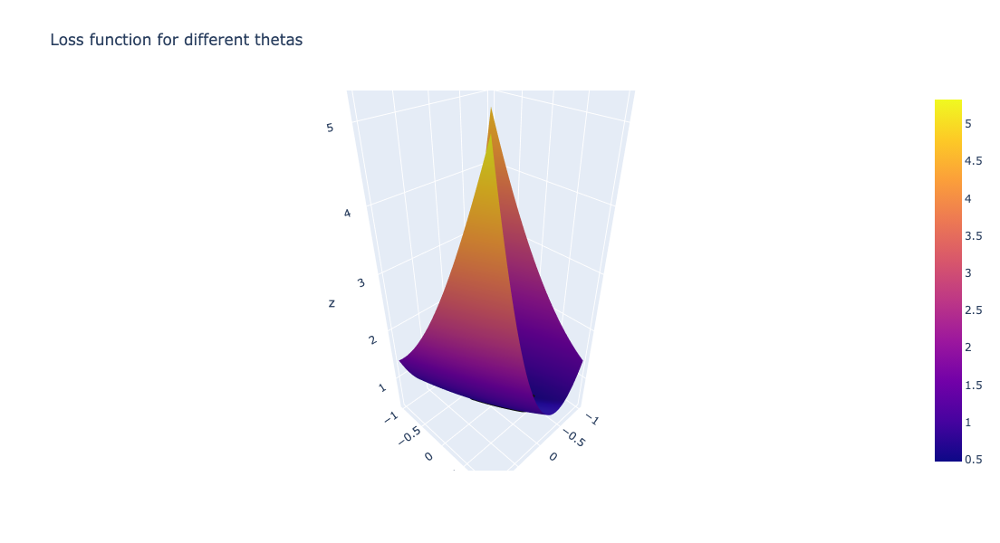

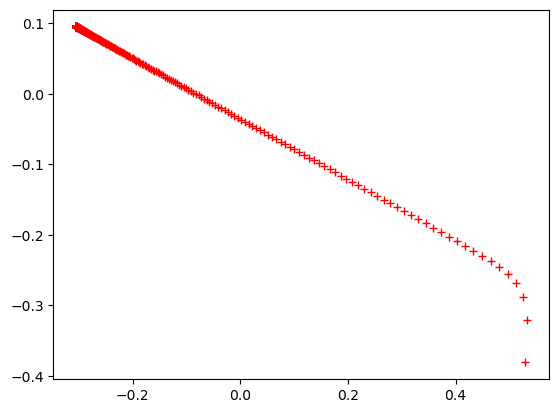

In [94]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 4.5 Weather Station Madrid in 1990

In [96]:
# Assuming df_1960.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_1990.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_1990['MADRID_temp_mean'].to_numpy().reshape(n_rows, 1)

In [97]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [98]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [99]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 478 ms, sys: 7.48 ms, total: 485 ms
Wall time: 190 ms


Starting value of theta0: -1.076624667631753
Ending value of theta0: -0.13935473106440407
Starting value of theta1: 0.7610773003653017
Ending value of theta1: 0.11098525148122405


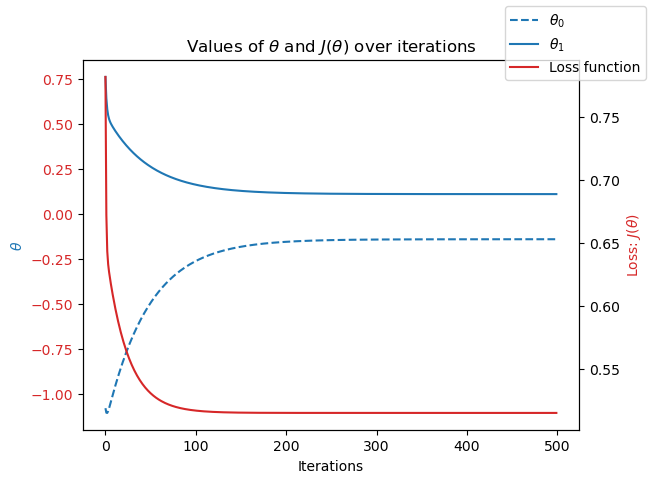

In [100]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [101]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.35 s, sys: 25 ms, total: 1.38 s
Wall time: 1.06 s


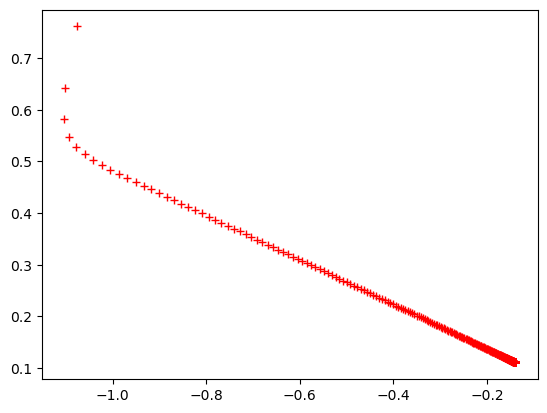

In [102]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [103]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[0.5],[-0.5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

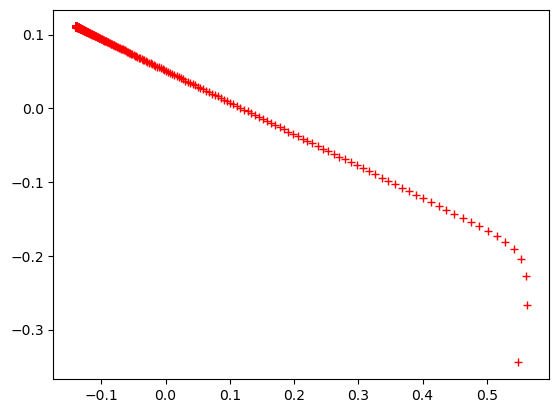

In [104]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 4.6 Weather Station Madrid in 2020

In [106]:
# Assuming df_1960.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_2020.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_2020['MADRID_temp_mean'].to_numpy().reshape(n_rows, 1)

In [107]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [108]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [109]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 500 ms, sys: 7.56 ms, total: 508 ms
Wall time: 200 ms


Starting value of theta0: -1.0689747874969715
Ending value of theta0: -0.07350353170681354
Starting value of theta1: 0.7751082249665481
Ending value of theta1: 0.11921002935770895


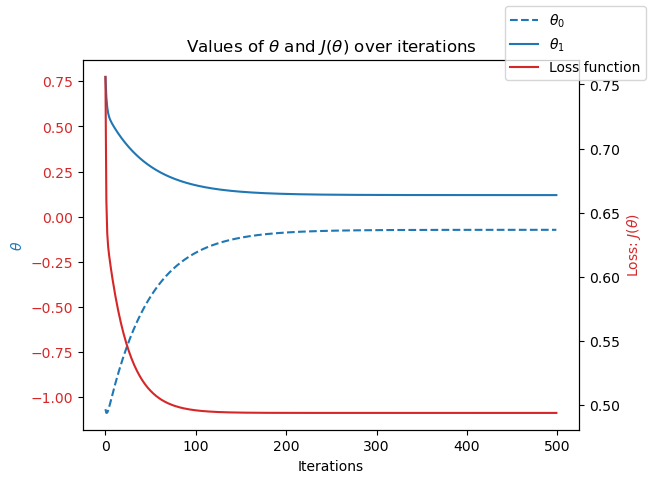

In [110]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [111]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.37 s, sys: 33.4 ms, total: 1.4 s
Wall time: 993 ms


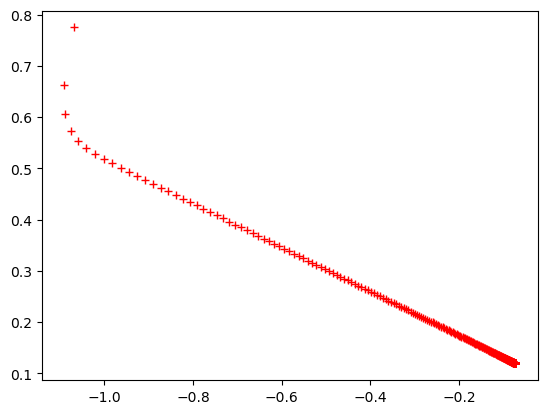

In [112]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [113]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[0.5],[-0.5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

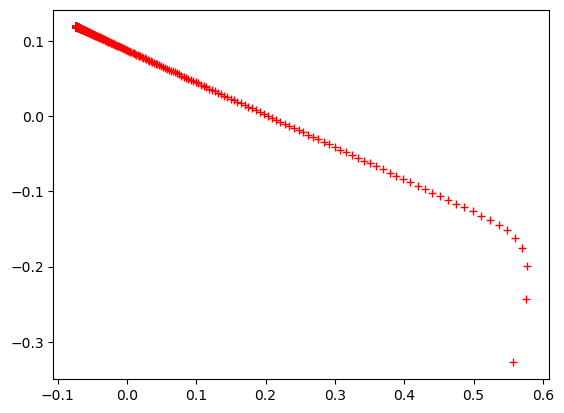

In [114]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 4.7 Weather Station Heathrow in 1960

In [116]:
# Assuming df_1960.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_1960.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_1960['HEATHROW_temp_mean'].to_numpy().reshape(n_rows, 1)

In [117]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [118]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [119]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 460 ms, sys: 6.89 ms, total: 467 ms
Wall time: 174 ms


Starting value of theta0: -1.0938366112278761
Ending value of theta0: -0.4098823244307017
Starting value of theta1: 0.7348259583322977
Ending value of theta1: 0.16703672813689954


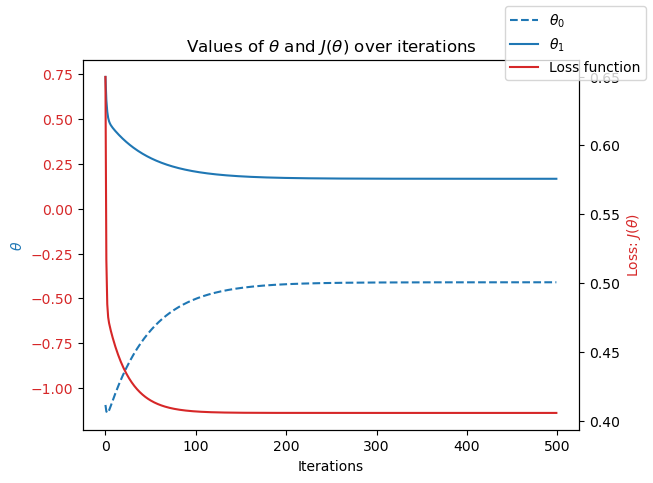

In [120]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

In [121]:
%%time
# theta range
theta0_vals = np.linspace(-1,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-1,1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.33 s, sys: 23.4 ms, total: 1.35 s
Wall time: 961 ms


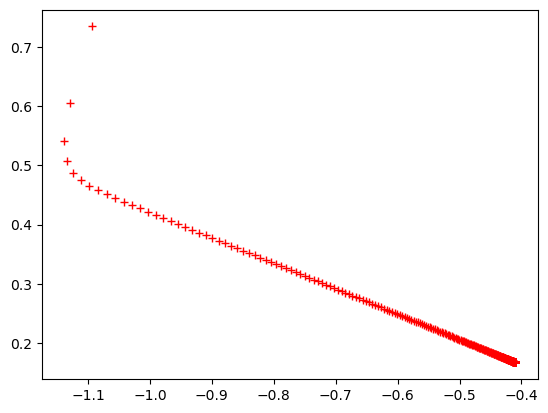

In [122]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [123]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[0.5],[-0.5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

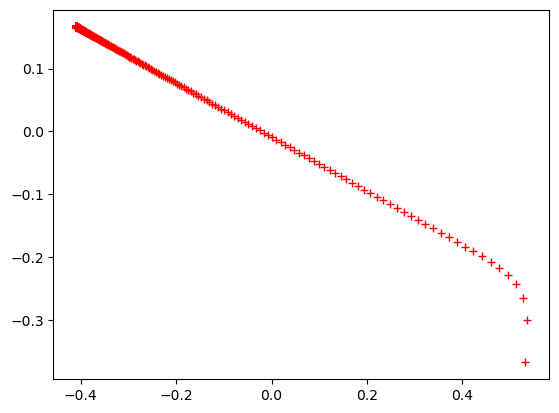

In [124]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 4.8 Weather Station Heathrow in 1990

In [126]:
# Assuming df_1960.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_1990.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_1990['HEATHROW_temp_mean'].to_numpy().reshape(n_rows, 1)

In [127]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [128]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [129]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 469 ms, sys: 8.9 ms, total: 478 ms
Wall time: 164 ms


Starting value of theta0: -1.0677271863797406
Ending value of theta0: -0.010756382896417312
Starting value of theta1: 0.7749557028026027
Ending value of theta1: 0.089332740494942


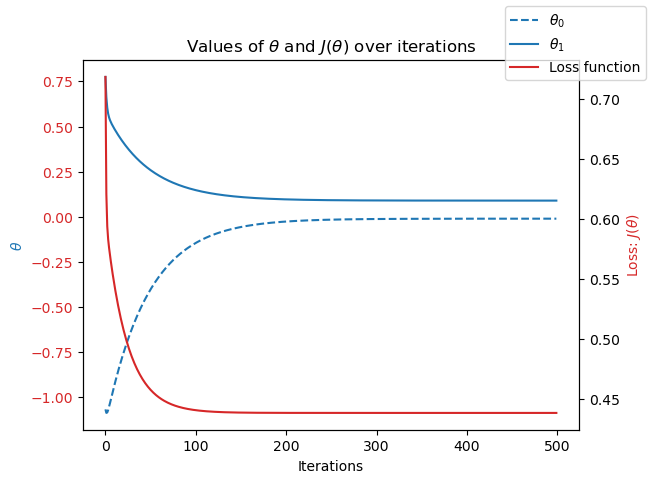

In [130]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

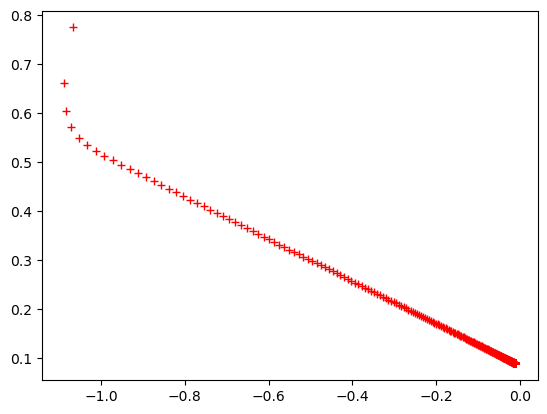

In [131]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [132]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[0.5],[-0.5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

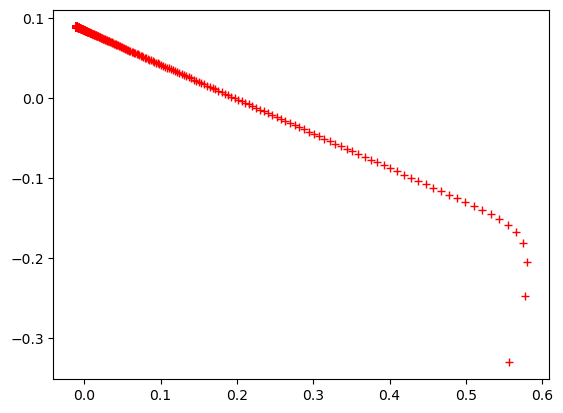

In [133]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 4.9 Weather Station Heathrow in 2020

In [265]:
# Assuming df_2020.shape[0] gives the correct number of rows (366 for a leap year)
n_rows = df_2020.shape[0]

# Adjust the index range to ensure it has exactly 'n_rows' elements
i = np.arange(0.01, n_rows * 0.01 + 0.01, 0.01)  # Creates an array of size 'n_rows'
index = pd.DataFrame(data=i, columns=['index'])

# Now reshape it correctly
X = index.to_numpy().reshape(n_rows, 1)

# Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows, 1))
X = np.concatenate((ones, X), axis=1)

y = df_2020['HEATHROW_temp_mean'].to_numpy().reshape(n_rows, 1)

In [266]:
#Compute the loss function for the gradian descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [267]:
#Compute the gradiant descent function

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [268]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 167 ms, sys: 5.82 ms, total: 173 ms
Wall time: 185 ms


Starting value of theta0: -1.0593380120889995
Ending value of theta0: 0.00793054917248463
Starting value of theta1: 0.79370008282233
Ending value of theta1: 0.12734809990220083


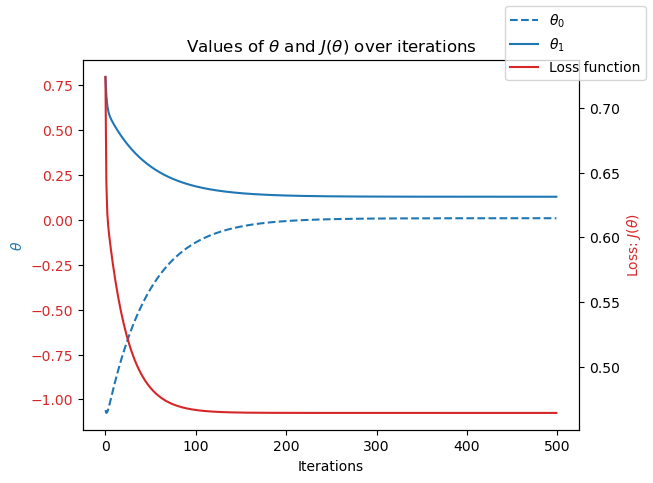

In [269]:
# Print the start and end values of theta0 and theta1
print(f"Starting value of theta0: {theta0_history[0]}")
print(f"Ending value of theta0: {theta0_history[-1]}")
print(f"Starting value of theta1: {theta1_history[0]}")
print(f"Ending value of theta1: {theta1_history[-1]}")

# This will plot your loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)

# Set axis labels and ticks
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Display the legend
fig.legend()

# Show the plot
plt.show()

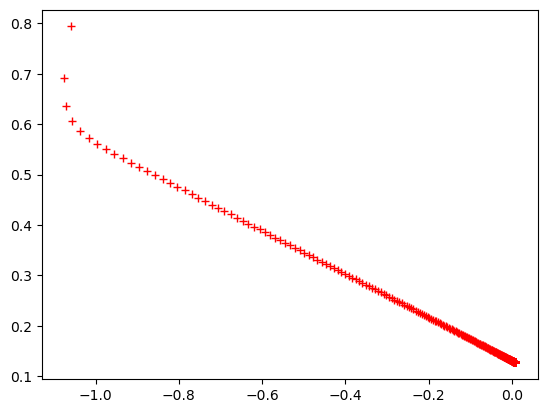

In [270]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [271]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[0.5],[-0.5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

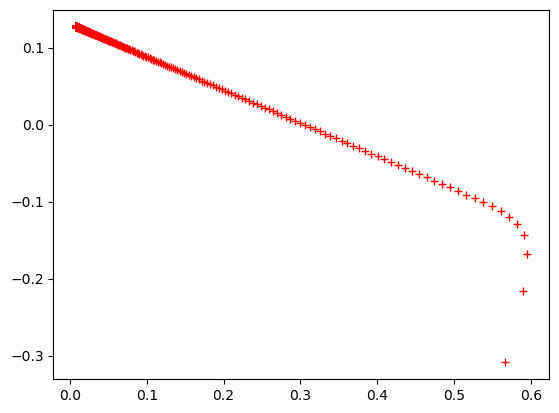

In [272]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

# 5. Three Observations over the past 60 years

In [292]:
# Create a new dataframe for observations purposes

df_ob = df_org[['DATE',
                 'MONTH',
                 'HEATHROW_temp_min',
                 'HEATHROW_temp_mean',
                 'HEATHROW_temp_max',
                 'MADRID_temp_min',
                 'MADRID_temp_mean',
                 'MADRID_temp_max',
                 'MUNCHENB_temp_min',
                 'MUNCHENB_temp_mean',
                 'MUNCHENB_temp_max']].copy()
print(df_ob)

            DATE  MONTH  HEATHROW_temp_min  HEATHROW_temp_mean  \
0     1960-01-01      1                9.4                10.6   
1     1960-01-02      1                3.9                 6.1   
2     1960-01-03      1                6.1                 8.4   
3     1960-01-04      1                6.7                 9.4   
4     1960-01-05      1                8.9                 8.9   
...          ...    ...                ...                 ...   
22945 2022-10-27     10               11.9                16.4   
22946 2022-10-28     10               12.7                15.8   
22947 2022-10-29     10               11.2                16.5   
22948 2022-10-30     10               13.4                15.2   
22949 2022-10-31     10                9.8                13.7   

       HEATHROW_temp_max  MADRID_temp_min  MADRID_temp_mean  MADRID_temp_max  \
0                    8.3              4.4               7.6             10.8   
1                   10.6              7.4      

In [294]:
# Create a Timeframe for the 60 years


df_ob_60 = df_ob[(df_temp_eu["DATE"] >= "1960-01-01") & (df_temp_eu["DATE"] <= "2020-12-31")]

print(df_ob_60)

            DATE  MONTH  HEATHROW_temp_min  HEATHROW_temp_mean  \
0     1960-01-01      1                9.4                10.6   
1     1960-01-02      1                3.9                 6.1   
2     1960-01-03      1                6.1                 8.4   
3     1960-01-04      1                6.7                 9.4   
4     1960-01-05      1                8.9                 8.9   
...          ...    ...                ...                 ...   
22276 2020-12-27     12                5.5                 6.2   
22277 2020-12-28     12               -1.6                 1.0   
22278 2020-12-29     12                0.4                 2.4   
22279 2020-12-30     12               -0.4                 2.5   
22280 2020-12-31     12               -3.2                -0.9   

       HEATHROW_temp_max  MADRID_temp_min  MADRID_temp_mean  MADRID_temp_max  \
0                    8.3              4.4               7.6             10.8   
1                   10.6              7.4      

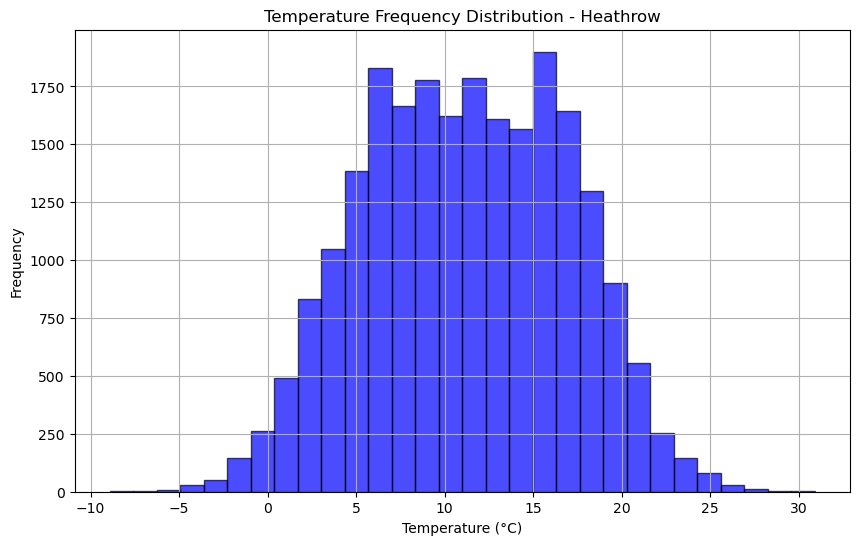

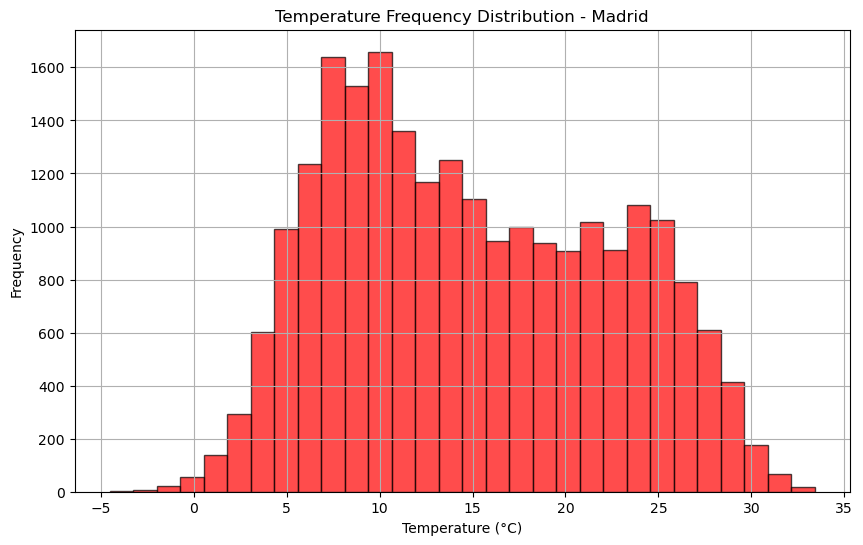

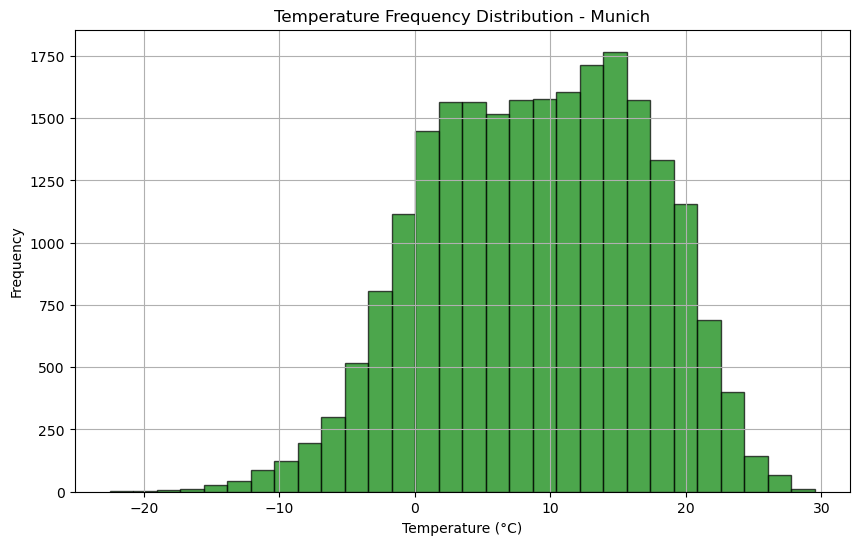

In [330]:
#Showing how often different temperature ranges occur.

import matplotlib.pyplot as plt

# Heathrow Histogram
plt.figure(figsize=(10, 6))
plt.hist(df_ob['HEATHROW_temp_mean'], bins=30, alpha=0.7, color='blue', edgecolor='black')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.title('Temperature Frequency Distribution - Heathrow')
plt.grid(True)
plt.show()

# Madrid Histogram
plt.figure(figsize=(10, 6))
plt.hist(df_ob['MADRID_temp_mean'], bins=30, alpha=0.7, color='red', edgecolor='black')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.title('Temperature Frequency Distribution - Madrid')
plt.grid(True)
plt.show()

# Munich Histogram
plt.figure(figsize=(10, 6))
plt.hist(df_ob['MUNCHENB_temp_mean'], bins=30, alpha=0.7, color='green', edgecolor='black')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.title('Temperature Frequency Distribution - Munich')
plt.grid(True)
plt.show()

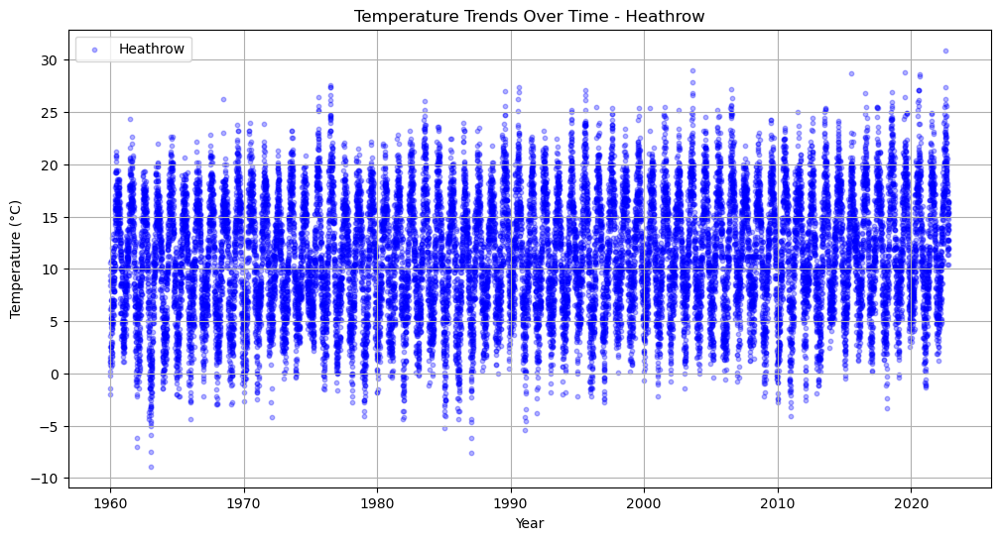

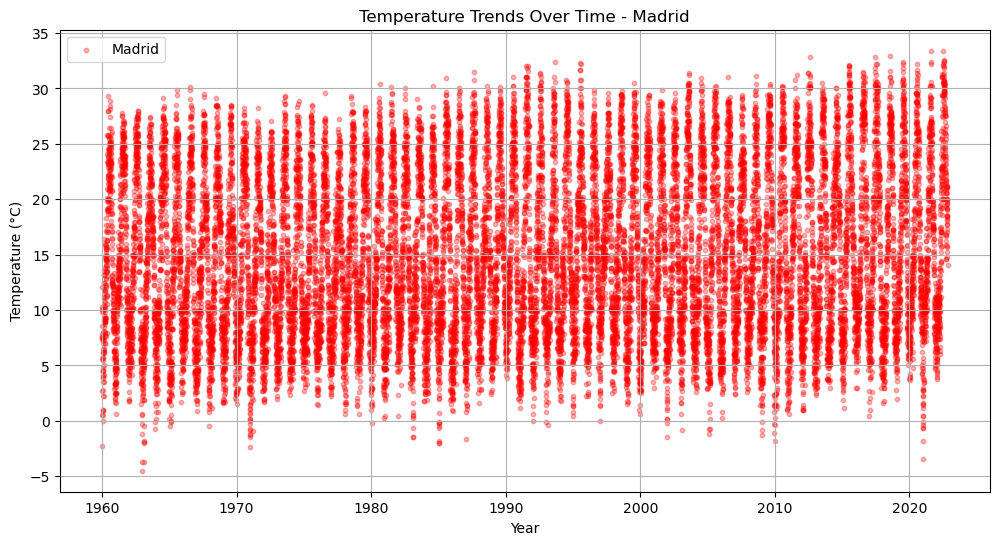

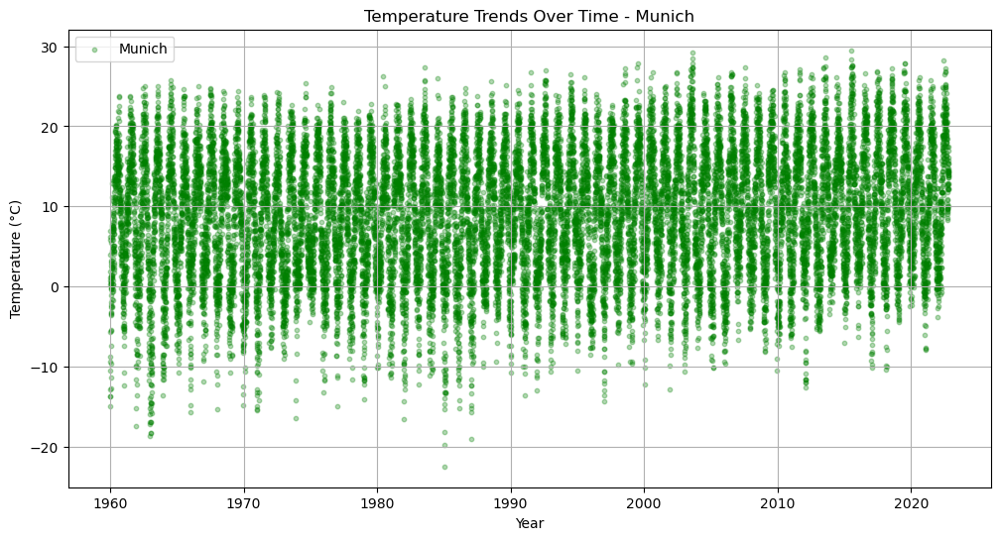

In [320]:
#Captureing long-term temperature trends without clutter.

# Heathrow
plt.figure(figsize=(12, 6))
plt.scatter(df_ob['DATE'], df_ob['HEATHROW_temp_mean'], label='Heathrow', color='blue', alpha=0.3, s=10)

# Formatting
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Trends Over Time - Heathrow')
plt.legend()
plt.grid(True)
plt.show()

# Madrid
plt.figure(figsize=(12, 6))
plt.scatter(df_ob['DATE'], df_ob['MADRID_temp_mean'], label='Madrid', color='red', alpha=0.3, s=10)

# Formatting
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Trends Over Time - Madrid')
plt.legend()
plt.grid(True)
plt.show()

# Munich
plt.figure(figsize=(12, 6))
plt.scatter(df_ob['DATE'], df_ob['MUNCHENB_temp_mean'], label='Munich', color='green', alpha=0.3, s=10)

# Formatting
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Trends Over Time - Munich')
plt.legend()
plt.grid(True)
plt.show()


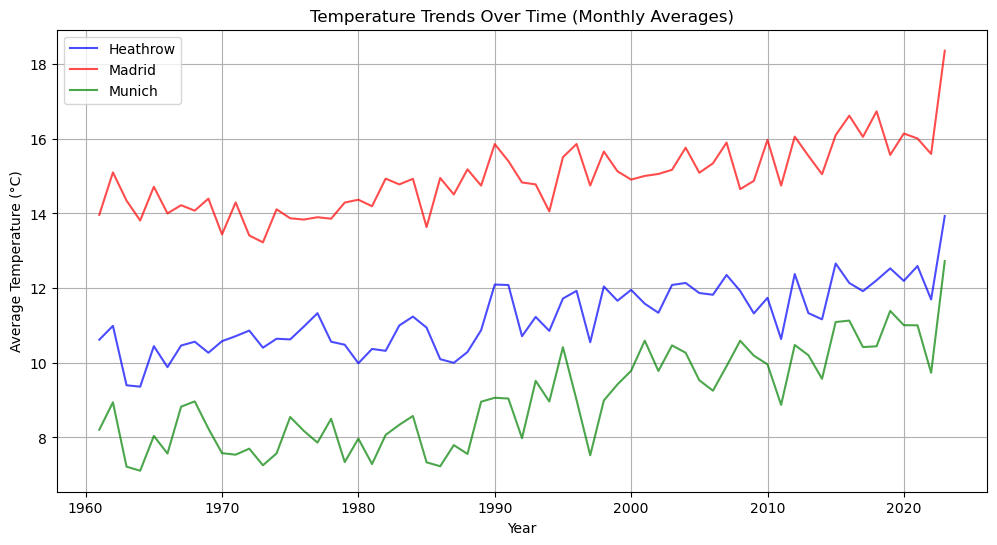

In [347]:
# Aggregate by Year-Month (or just Year)
df_monthly = df_ob.resample('ME', on='DATE').mean()  # Monthly averages
df_yearly = df_ob.resample('YE', on='DATE').mean()   # Yearly averages

# Heathrow
plt.figure(figsize=(12, 6))
plt.plot(df_yearly.index, df_yearly['HEATHROW_temp_mean'], label='Heathrow', color='blue', alpha=0.7)
plt.plot(df_yearly.index, df_yearly['MADRID_temp_mean'], label='Madrid', color='red', alpha=0.7)
plt.plot(df_yearly.index, df_yearly['MUNCHENB_temp_mean'], label='Munich', color='green', alpha=0.7)

# Formatting
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.title('Temperature Trends Over Time (Monthly Averages)')
plt.legend()
plt.grid(True)
plt.show()

__Comment on average temperature values:__ 

- 1. __Scatterplot:__ The temperature across all weather stations increased in the past 60 years. Interessting to observe is that the maximum temperature increase is lower compared the to decrease of the minimum temperature. Munich accounts the lowest temperature of the three weather stations.
- 2. __Histogram:__ The count of certain temperature is the most balanced in Madrid in a range between **5°C - 25°C** and shows the highest temperature of **(33°C)** and in Munich I can find the widest spectrum of different temperatures **-20°C - 29°C**
- 3. __Line Chart:__ Munich has the biggest increase in average temperature over the past 60 years.